## Adriano Cicco Group L

## Steam dataset

Link dataset:
https://www.kaggle.com/datasets/trolukovich/steam-games-complete-dataset

Questo dataset contiene dati relativi a steam, una piattaforma per la vendita di videogames.

In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
df = pd.read_csv("data/steam_games.csv")

pd.options.mode.chained_assignment = None  # default='warn'

## trasforma il campo release_date in datetime

In [2]:
dfrelease_date=df

In [3]:
dfrelease_date["release_date"]=pd.to_datetime(dfrelease_date["release_date"], format='%b %d, %Y', errors='coerce')
dfrelease_date = dfrelease_date.dropna(subset=['release_date'])


In [4]:
df_time=dfrelease_date.sort_values(by='release_date')

## numero di giochi negli anni

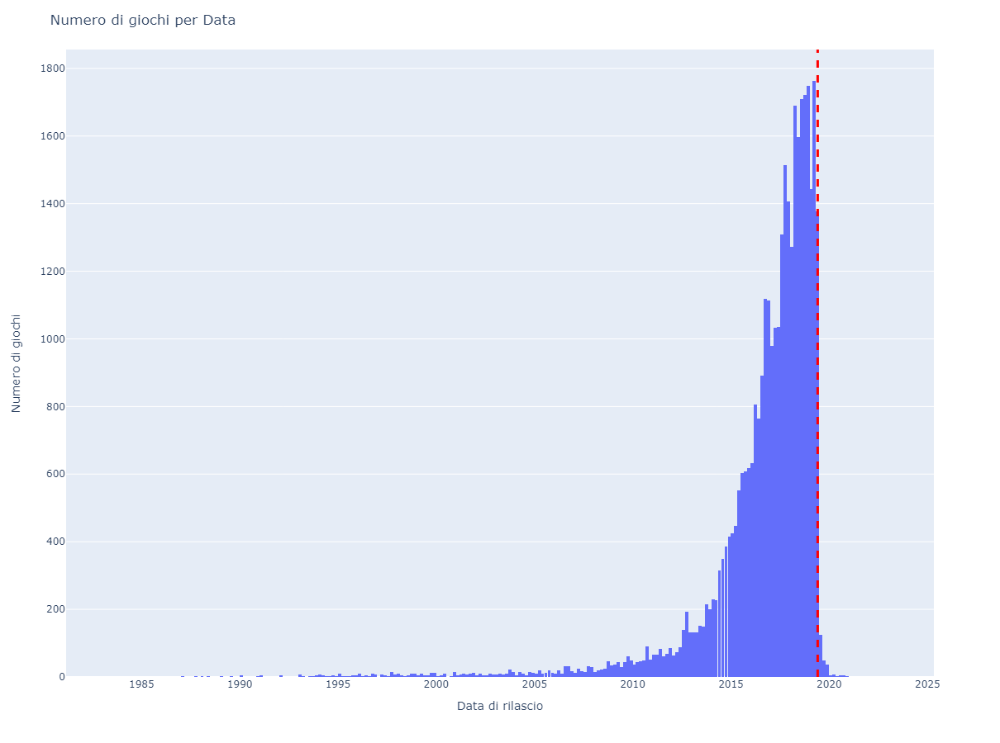

In [5]:
fig= px.histogram(df_time,x="release_date", height=900)
fig.update_layout(
    title="Numero di giochi per Data",
    xaxis_title="Data di rilascio",
    yaxis_title="Numero di giochi",
)
fig.add_vline(x='2019-06-01', line_width=3, line_dash="dash", line_color="red")

fig.show()

## Inizio analisi linguistica

In [6]:

df1=df
df1.loc[:,"languages"]= df1['languages'].str.replace(" ","")

In [7]:
dflanguages= df.dropna(subset=['languages'])

#le lingue sono fornite tramite una colonna con le lingue separate da ','

dflanguages.loc[:,"languages"]=dflanguages.loc[:,"languages"].str.split(",") 


In [8]:
dflanguagesExplode=dflanguages.explode('languages')

dfgroup= dflanguagesExplode.groupby('languages')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
dfgroup=dfgroup.loc[dfgroup['count']>5,:].head(10)

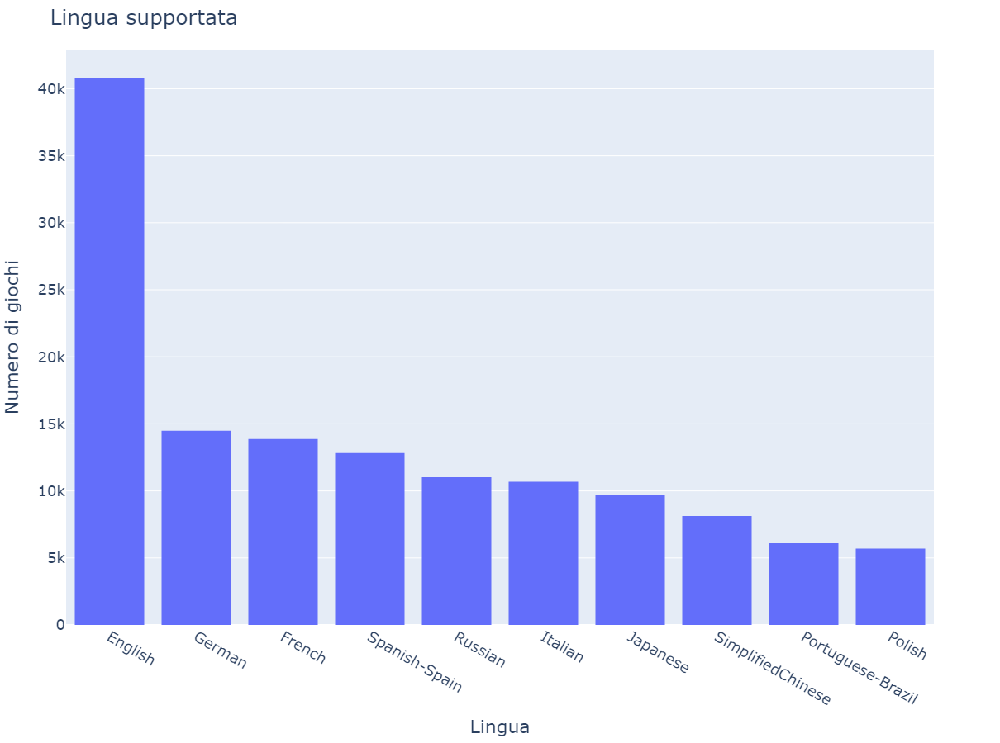

In [9]:
fig = px.histogram(dfgroup,x=dfgroup.index,y="count", height=900)

fig.update_layout(
    title="Lingua supportata",
    xaxis_title="Lingua",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()

In [10]:
filteredPrice=df

#prendo tutte le righe contenenti il prezzo espresso in dollari oppure contengono il testo 'Free'
filteredPrice=filteredPrice.dropna(subset=['original_price'])
filteredPrice=filteredPrice.loc[filteredPrice["original_price"].str.contains("$")|filteredPrice["original_price"].str.contains("Free") ,:]


#tolgo il simbolo del $
filteredPrice['original_price'] = filteredPrice['original_price'].dropna().str.replace("$","",regex=True).dropna().str.replace("$","",regex=True)

filteredPrice=filteredPrice.dropna(subset=['original_price'])

#trasformo le righe contenenti Free in 0
filteredPrice.loc[filteredPrice["original_price"].str.contains("Free"),:]='0'

#casto la colonna ad un numeric
filteredPrice['original_price']=pd.to_numeric(filteredPrice['original_price'],errors='coerce')

#filtro per i prezzi inferiori a 10000
filteredPrice=filteredPrice.dropna(subset=['original_price']).loc[filteredPrice['original_price']<10000,:]
filteredPrice.sort_values(by="original_price",ascending=True)
print()

## distribuzione dei prezzi

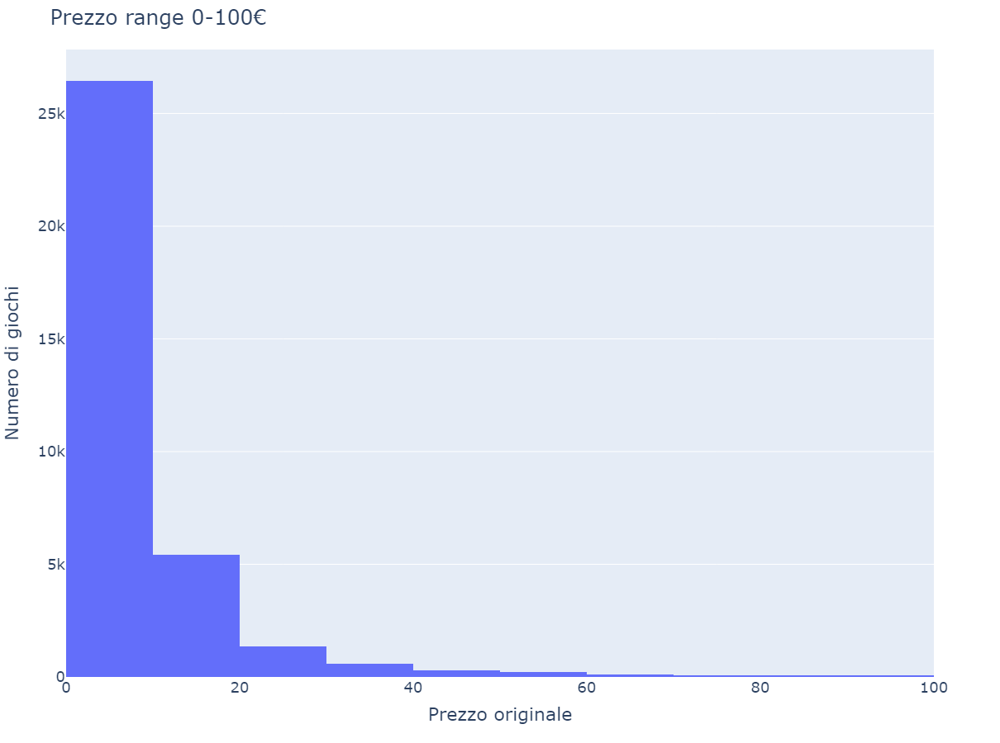

In [11]:

fig= px.histogram(filteredPrice,x='original_price', height=900,nbins=150)

fig.update_layout(
    title="Prezzo range 0-100€",
    xaxis_title="Prezzo originale",
    yaxis_title="Numero di giochi",
    xaxis_range=[0,100],
    font=dict(
        size=18,
    )
)

fig.show()

## Top 11 generi più diffusi

In [12]:
dfgenre=df
dfgenre= df.dropna(subset=['genre'])

#casto la colonna a stringa, la splitto e faccio l'explode nella colossa
dfgenre.loc[:,"genre"]=dfgenre["genre"].astype(str)
dfgenre.loc[:,"genre"]=dfgenre["genre"].str.split(",")
dfgenreExplode=dfgenre.explode('genre')


dfgroup= dfgenreExplode.groupby('genre')['name'].count()


dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")


In [13]:
dfgroupGenre=dfgroup.head(11)

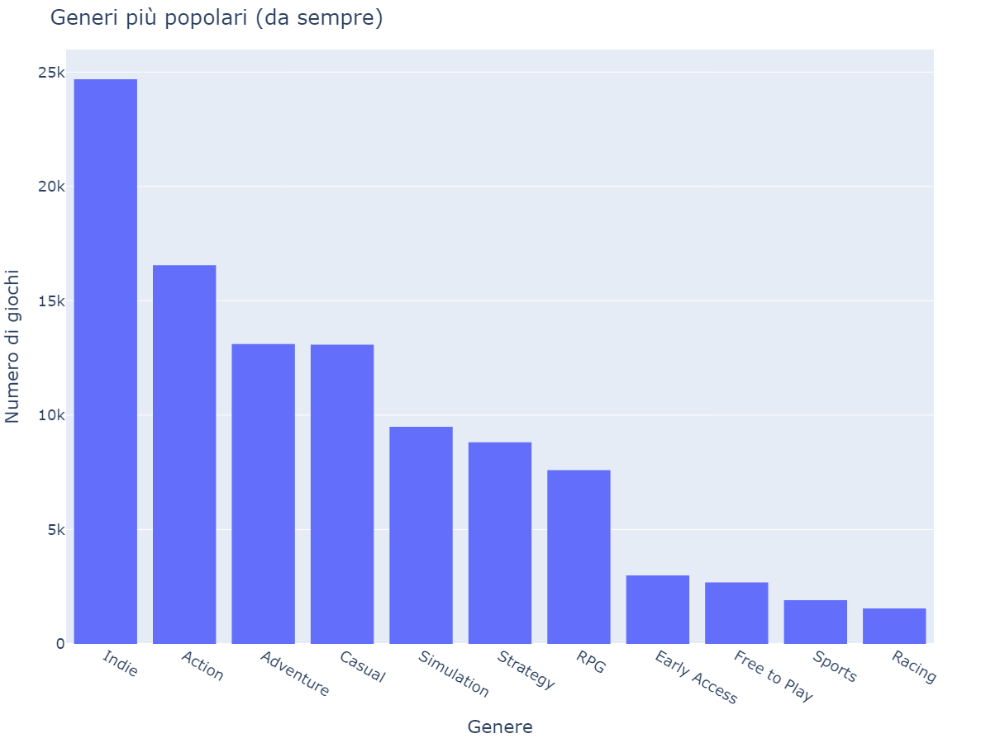

In [14]:
fig= px.histogram(dfgroupGenre,x=dfgroupGenre.index,y="count", height=900)

fig.update_layout(
    title="Generi più popolari (da sempre)",
    xaxis_title="Genere",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()

## Crescita del multiplayer negli anni

Analizzare la percentuale di tag multiplayer in confronto di quelli single player

In [15]:
dfgame_details=df
dfgame_details= df.dropna(subset=['game_details'])

dfgame_details["game_details"]=dfgame_details["game_details"].astype(str)
dfgame_details["game_details"]=dfgame_details["game_details"].str.split(",")

dfgame_details["release_date"]=pd.to_datetime(dfgame_details["release_date"], format='%b %d, %Y', errors='coerce')
dfgame_details = dfgame_details.dropna(subset=['release_date'])
dfgame_details["year"]=dfgame_details["release_date"].dt.year
dfgame_details=dfgame_details.loc[dfgame_details["year"]<2019,:]

dfgame_detailsExplode=dfgame_details.explode('game_details')

dfgroup= dfgame_detailsExplode.groupby('game_details')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")

dfgroup.index= dfgroup.index.map(str)
dfgroup=dfgroup.loc[dfgroup.index.str.contains("online", case=False)|dfgroup.index.str.contains("Local", case=False),:]

dfgame_detailsExplode=pd.merge(dfgroup, dfgame_detailsExplode, on='game_details')
print()


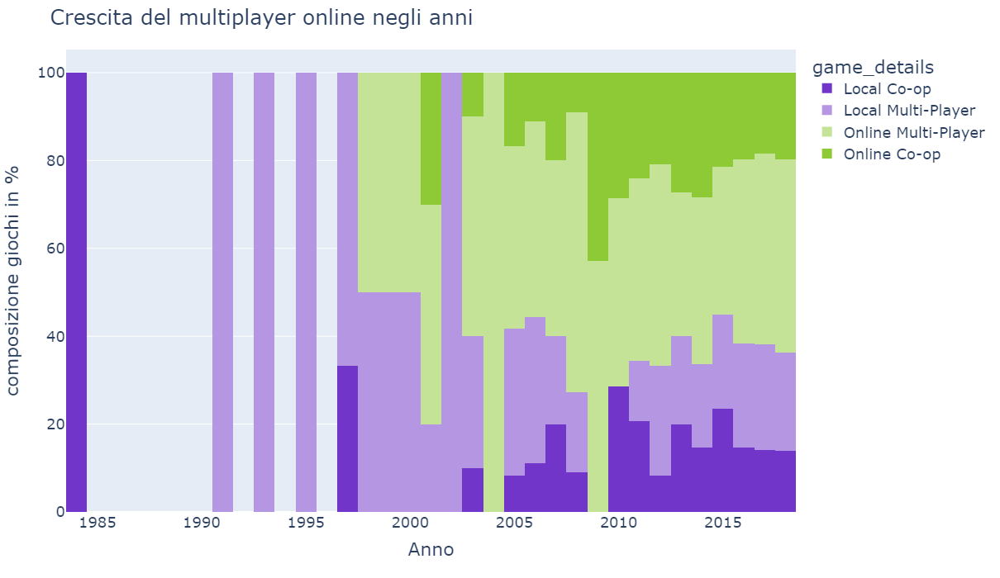

In [16]:
fig= px.histogram(dfgame_detailsExplode.sort_values(by="year"),x="year", color="game_details",height=700,barnorm = "percent",
            color_discrete_map={"Local Co-op": '#7136C9',"Online Co-op": '#8EC936',"Local Multi-Player":"#B596E3","Online Multi-Player":"#C4E396"})
fig.update_layout(
    title="Crescita del multiplayer online negli anni",
    xaxis_title="Anno",
    yaxis_title="composizione giochi in %",
    font=dict(
        size=18,
    )
)
fig.show()

## distribuzione delle valutazioni

In [17]:

dfall_reviews=df
dfall_reviews=dfall_reviews.dropna(subset=['all_reviews'])
#print(dfall_reviews['all_reviews'])
dfall_reviews["all_reviews"]=dfall_reviews["all_reviews"].str.split(",")
dfall_reviews= dfall_reviews.loc[~dfall_reviews["all_reviews"].str[0].str.contains('user', regex=True, case=False),:]



dfall_reviews['grades']=dfall_reviews["all_reviews"].str[0]

dfgroup = dfall_reviews.groupby('grades')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")



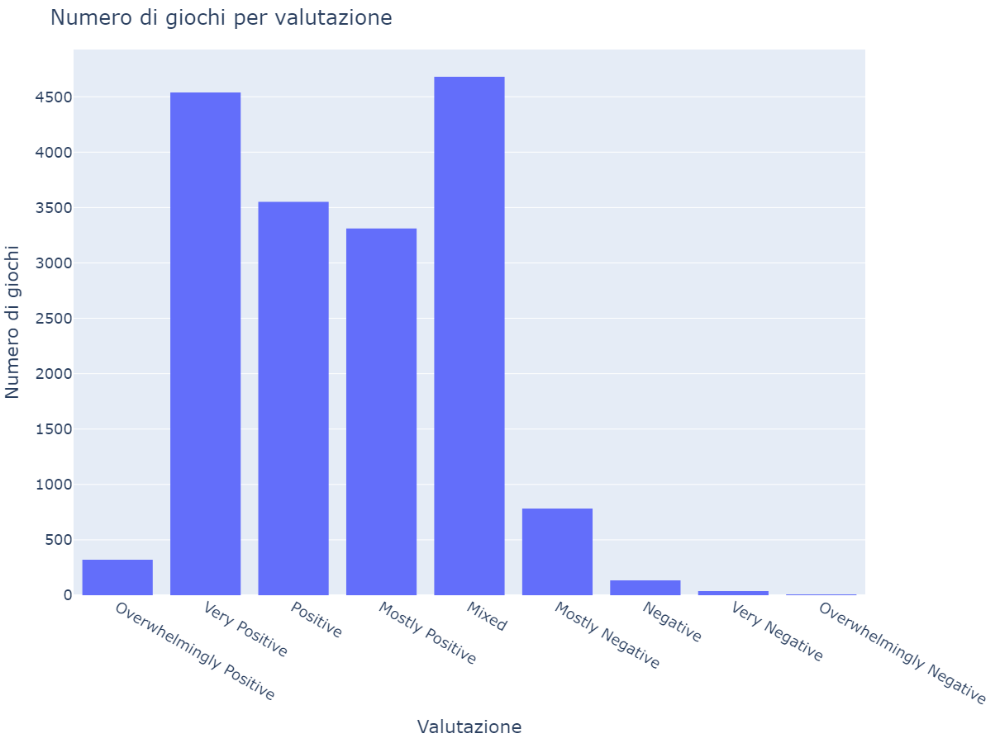

In [18]:
fig = px.histogram(dfgroup,
                   x=dfgroup.index,
                   y="count",
                   height=900,category_orders=dict(grades=["Overwhelmingly Positive", "Very Positive", "Positive", "Mostly Positive","Mixed" , "Mostly Negative","Negative","Very Negative","Overwhelmingly Negative"]),
                  )


fig.update_layout(
    title="Numero di giochi per valutazione",
    xaxis_title="Valutazione",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()


In [19]:
dfall_reviewsWithGenre = dfall_reviews

In [20]:
dfall_reviewsWithGenre["grades"]=dfall_reviewsWithGenre["all_reviews"].str[0]
dfall_reviewsWithGenre["grades"]

dfall_reviewsWithGenre= dfall_reviewsWithGenre.dropna(subset=['genre'])

dfall_reviewsWithGenre["genre"]=dfall_reviewsWithGenre["genre"].astype(str)
dfall_reviewsWithGenre["genre"]=dfall_reviewsWithGenre["genre"].str.split(",")
dfall_reviewsWithGenre=dfall_reviewsWithGenre.explode('genre')


## Rapporto tra valutazione e genere

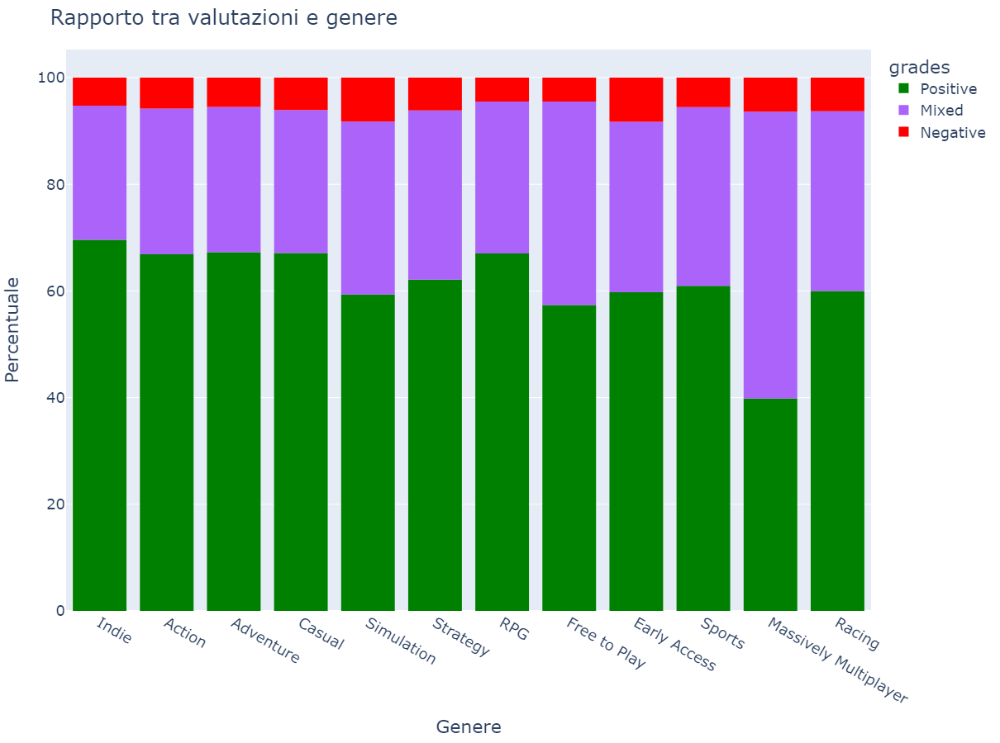

In [21]:

dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Positive', case=False),'grades']='Positive'
dfall_reviewsWithGenre.loc[dfall_reviewsWithGenre['grades'].str.contains('Negative', case=False),'grades']='Negative'

dfall_reviewsWithGenreTest=dfall_reviewsWithGenre.groupby(['genre'])['name'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False).head(12)

dfdfall_reviewsWithGenreFinish=pd.merge(dfall_reviewsWithGenre, dfall_reviewsWithGenreTest, on='genre')
dfdfall_reviewsWithGenreFinish=dfdfall_reviewsWithGenreFinish.loc[dfdfall_reviewsWithGenreFinish["Count"]>20,:].sort_values(by="Count", ascending=False)

fig = px.histogram(dfdfall_reviewsWithGenreFinish,x="genre", color="grades", height=900,
                   color_discrete_map={"Positive": 'green',"Negative": 'red',"mixed":"blue"},
                   barnorm = "percent", 
                  )



fig.update_layout(
    title="Rapporto tra valutazioni e genere",
    xaxis_title="Genere",
    yaxis_title="Percentuale",
    font=dict(
        size=18,
    )
)

fig.show()



## Sistema operativo supportato

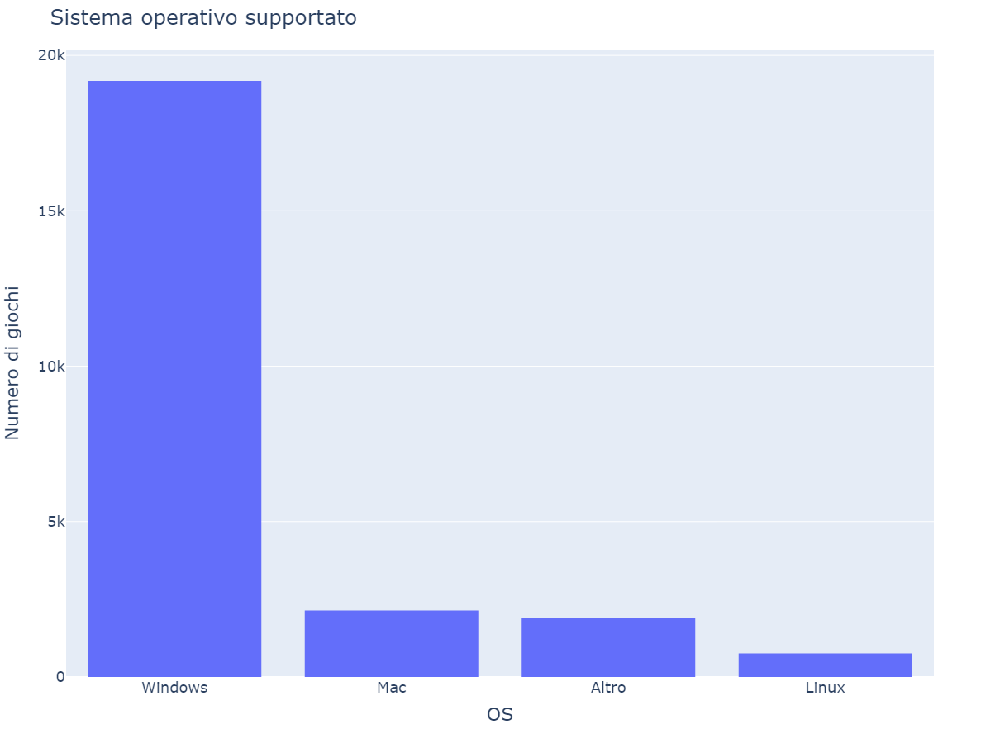

In [22]:
dfOS=df
dfOS=dfOS.dropna(subset=['minimum_requirements'])
dfOS['OS']="Altro"
dfOS.loc[dfOS['minimum_requirements'].str.contains("Windows", case=False),"OS"]="Windows"
dfOS.loc[dfOS['minimum_requirements'].str.contains("Linux", case=False),"OS"]+=",Linux"
dfOS.loc[dfOS['minimum_requirements'].str.contains("Mac", case=False),"OS"]+=",Mac"
dfOS["OS"]=dfOS["OS"].str.split(",")
dfOSExplode=dfOS.explode('OS')

dfgroup= dfOSExplode.groupby('OS')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
dfgroup
fig = px.histogram(dfgroup, x=dfgroup.index, y="count",
                   height=900,
                  )
fig=fig.update_layout(
    title="Sistema operativo supportato",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)

fig.show()


## rapporto sconto e prezzo originale

In [23]:

filteredPrice=filteredPrice.dropna(subset=['discount_price'])

filteredPrice=filteredPrice.loc[filteredPrice["discount_price"].str.contains("$")|filteredPrice["discount_price"].str.contains("Free") ,:]
filteredPrice['discount_price'] = filteredPrice['discount_price'].dropna().str.replace("$","",regex=True).dropna().str.replace("$","",regex=True)
filteredPrice=filteredPrice.dropna(subset=['discount_price'])
filteredPrice.loc[filteredPrice["discount_price"].str.contains("Free"),:]='0'
filteredPrice['discount_price']=pd.to_numeric(filteredPrice['discount_price'],errors='coerce')
filteredPrice=filteredPrice.dropna(subset=['discount_price']).loc[filteredPrice['discount_price']<10000,:]
filteredPrice=filteredPrice.loc[filteredPrice["discount_price"]<filteredPrice["original_price"],:]
filteredPrice=filteredPrice.loc[filteredPrice["original_price"]<100,:]


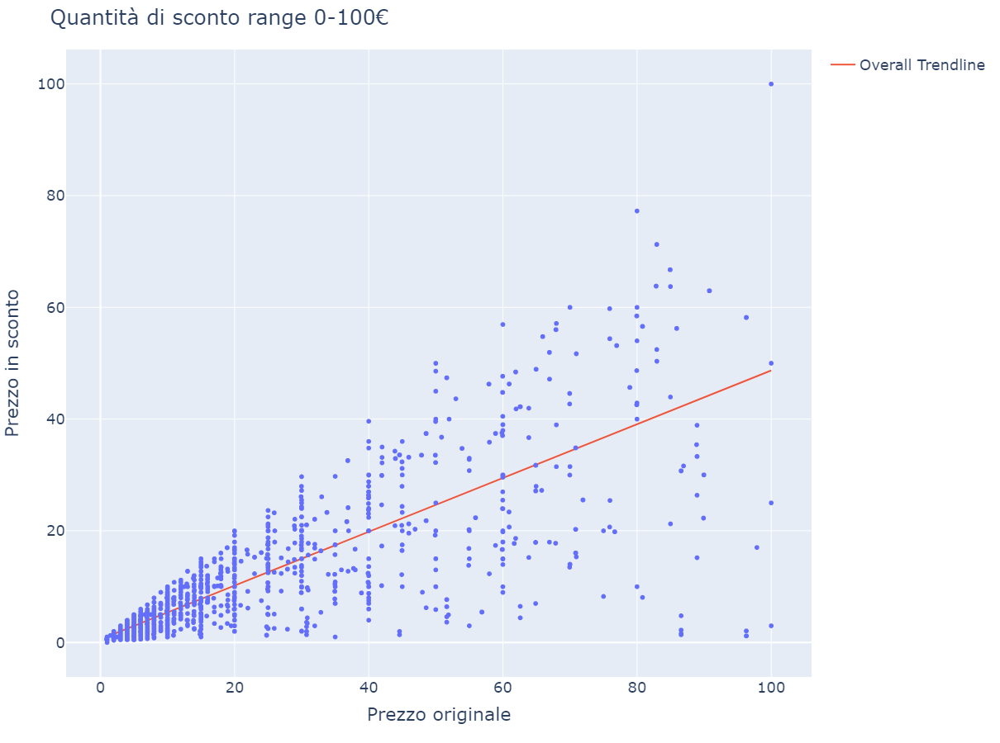

In [24]:
fig=px.scatter(filteredPrice,x="original_price",y="discount_price", height=900, trendline="ols", trendline_scope="overall")

fig.update_layout(
    title="Quantità di sconto range 0-100€",
    xaxis_title="Prezzo originale",
    yaxis_title="Prezzo in sconto",
    font=dict(
        size=18,
    )
)

fig.show()


## chi ha pubblicato più giochi

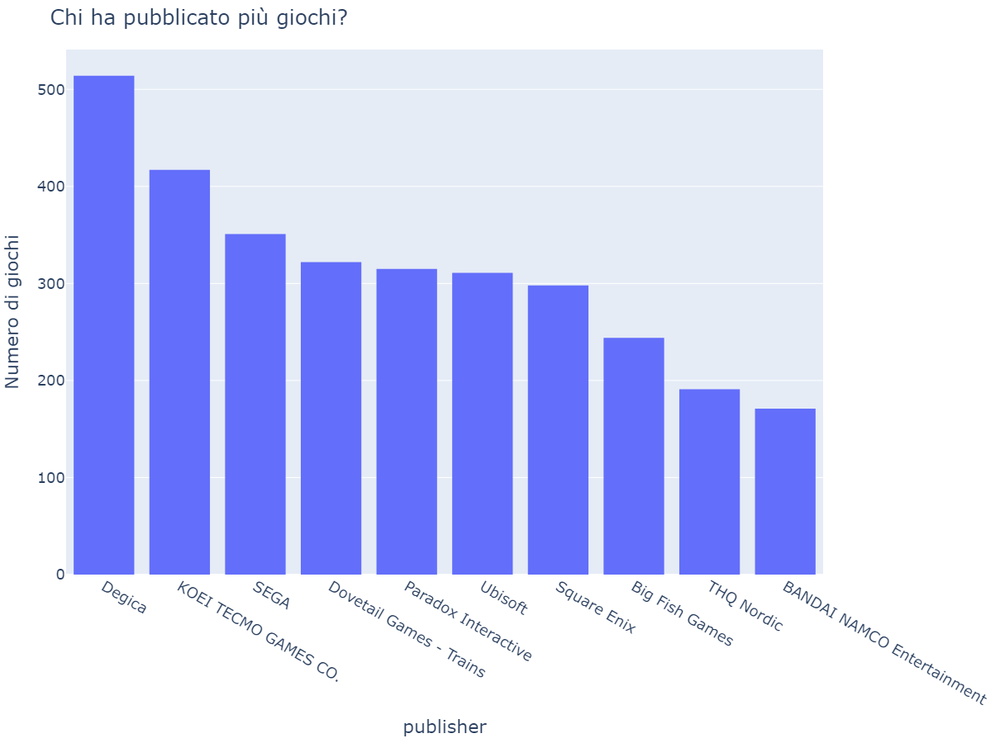

In [25]:
dfpublisher=df
dfpublisher.dropna(subset=['publisher'])
dfpublisher['publisher']=dfpublisher["publisher"].str.split(",").str[0]

dfgroup= dfpublisher.groupby('publisher')['name'].count()
dfgroup=dfgroup.sort_values(ascending=False).to_frame(name="count")
dfgroup=dfgroup.head(10)

fig=px.histogram(dfgroup, x=dfgroup.index, y="count", height=900)

fig.update_layout(
    title="Chi ha pubblicato più giochi?",
    yaxis_title="Numero di giochi",
    font=dict(
        size=18,
    )
)
fig.show()


In [26]:
#df.columns

## Media lunghezza nomi per genere

In [27]:
dfgenreExplode["nameLength"]=dfgenreExplode["name"].str.len()
dfgenrePlot=dfgenreExplode.loc[:,["genre","name","nameLength"]]
dfgroup= dfgenrePlot.groupby('genre')['nameLength'].count()
dfgroup2= dfgenrePlot.groupby('genre')['nameLength'].mean()
dfgroup=pd.merge(dfgroup,dfgroup2,on='genre')
dfgroup=dfgroup.loc[dfgroup["nameLength_x"]>400].sort_values(by="nameLength_x",ascending=False)
dfgroup
print()

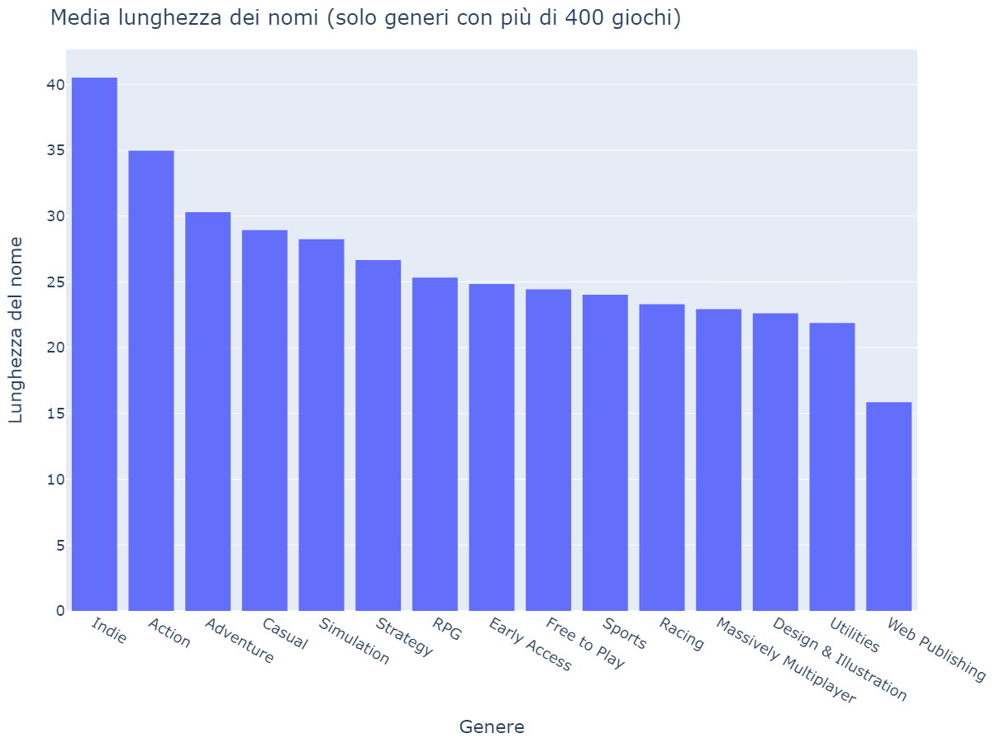

In [28]:
fig= px.histogram(dfgroup.sort_values(by="nameLength_y", ascending=False), x=dfgroup.index, y="nameLength_y", height=900)

fig.update_layout(
    title="Media lunghezza dei nomi (solo generi con più di 400 giochi)",
    xaxis_title="Genere",
    yaxis_title="Lunghezza del nome",
    font=dict(
        size=18,
    )
)
fig.show()

## Evoluzione dei primi 7 generi nel tempo

In [29]:
dfGenreDate=dfrelease_date
dfGenreDate["year"]=dfGenreDate["release_date"].dt.year

In [30]:
dfGenreDate= dfGenreDate.dropna(subset=['genre'])

dfGenreDate["genre"]=dfGenreDate["genre"].astype(str)
dfGenreDate["genre"]=dfGenreDate["genre"].str.split(",")
dfGenreDateExplode=dfGenreDate.explode('genre')
dfGenreDateExplode.sort_values(by='year')
dfGenreDateExplode.reset_index(drop=True)
print()


In [31]:
dfall_reviewsWithGenreTest=dfall_reviewsWithGenre.groupby(['genre'])['name'].count().reset_index(
  name='Count').sort_values(['Count'], ascending=False).head(7)


dfall_reviewsWithGenreMerge=pd.merge(dfall_reviewsWithGenreTest,dfGenreDateExplode,on="genre")

In [32]:
dfall_reviewsWithGenreMerge=dfall_reviewsWithGenreMerge.loc[dfall_reviewsWithGenreMerge["year"]<2019]

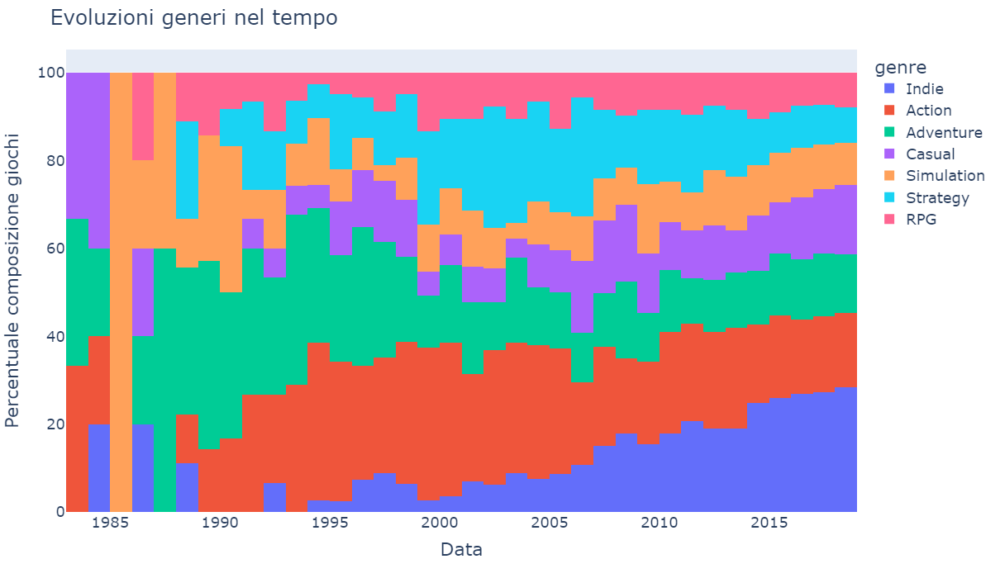

In [33]:




fig = px.histogram(dfall_reviewsWithGenreMerge, x="release_date", color="genre", nbins=50,barnorm = "percent", height=700)

fig.update_layout(
    title="Evoluzioni generi nel tempo",
    xaxis_title="Data",
    yaxis_title="Percentuale composizione giochi",
    font=dict(
        size=18,
    )
)


fig.show()

## Animazione crescita generi nel tempo

In [34]:
for year in range(dfGenreDateExplode.year.min(),dfGenreDateExplode.year.max()):
    dfGenreDateExplode.loc[dfGenreDateExplode["year"]==year,"count"]=dfGenreDateExplode.loc[dfGenreDateExplode["year"]==year,"name"].count()


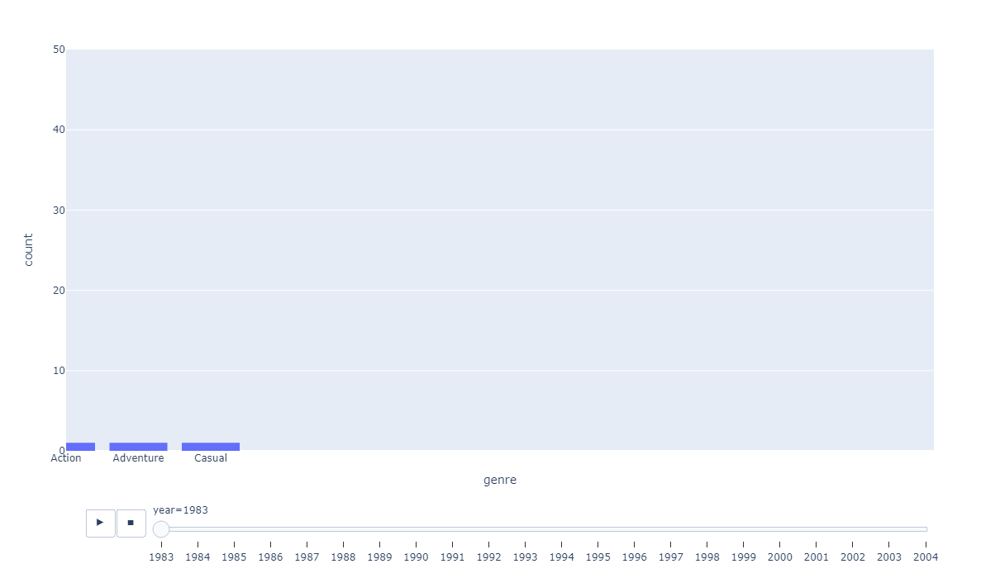

In [35]:
dfGenreDateExplode=dfGenreDateExplode.dropna(subset=['count']).sort_values(by=['year', 'count']);
fig = px.histogram(dfGenreDateExplode.loc[dfGenreDateExplode["year"]<2005,:], animation_frame="year", x="genre",height=700)


fig.update_layout(xaxis_range=(0, 12),
                 yaxis_range=(0, 50))

fig.show()